**FASTER RCNN**

**RCNN** extrai regiões de uma imagem utilizando busca seletiva e então checa se alguma dessas regiões contém um objeto. Isot é, extrai as regiões e então uma CNN extrai as características da imagem.

**Fast RCNN** passa a imagem na ConvNet que gera as ROIs. Ela é rápida quando aplicada em grandes datasets.

**Faster RCNN** corrige o problema da busca seletiva, trocando-o por uma rede de geração de regiões

CNN: Divide a imagem em regiões e então classifca cada região. Mas precisa de uma grande quantidade de dados para operar;

RCNN: Usa busca seletiva para gerar as regiões. Mas consome muitos recursos computacionais;

Fast RCNN: Cada imagem passa por uma CNN e os mapas de caracteristicas são extraídos. Ainda utiliza a busca seletiva que consome muitos recursos computacionais;

Faster RCNN: Troca a busca seletiva por uma rede de proposta de regiões. Mas, a performance do sistema depende de como o sistema se saiu anteriormente.


Referências:

[1] https://www.analyticsvidhya.com/blog/2018/11/implementation-faster-r-cnn-python-object-detection/

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


No colab ao executar os códigos está ocorrendo um erro de GPU, então recomenda-se executar os códigos utilizando a CPU.

In [3]:
# Instalando o tensorflow e os pacotes necessários
!pip install tensorflow==2.7.0 # Evitar erros
!pip install pycocotools
!pip install tf_slim

In [4]:
# Importações necessárias
import os
import pathlib

import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

import tensorflow as tf

In [5]:
# Fazendo o Download da API
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

In [6]:
# Compilando o modelo
%cd /content/models/research/
!protoc object_detection/protos/*.proto --python_out=.

/content/models/research


In [7]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [8]:
'''
  Classe base para criar um modelo baseado na API de detecção de objetos do TensorFlow
'''
class ModeloObjectDetectionAPI():
  nome_modelo = ''
  caminho_labels = ''
  indices_categorias = {}
  modelo = None
  output_dict = {}
  nivel_confianca = 0.0

  def __init__(self, nome_modelo = '', caminho_labels = '', nivel_confianca = 0.5):
    self.nome_modelo = nome_modelo
    self.caminho_labels = caminho_labels
    self.indices_categorias = label_map_util.create_category_index_from_labelmap(caminho_labels, use_display_name=True)
    self.nivel_confianca = nivel_confianca
    self.carregar_model()
    
  
  def carregar_model(self):
    '''
      Realiza o download e cria o modelo
    '''
    base_url = 'http://download.tensorflow.org/models/object_detection/'  # Link para baixar o modelo
    model_file = self.nome_modelo + '.tar.gz'

    model_dir = tf.keras.utils.get_file(
      fname=self.nome_modelo, 
      origin=base_url + model_file,
      untar=True)

    model_dir = pathlib.Path(model_dir)/'saved_model'

    model = tf.saved_model.load(str(model_dir))
    model = model.signatures['serving_default']

    self.modelo = model
    
  def executar_deteccao_imagem(self, imagem):
    '''
      Realiza a detecção dos objetos em um única imagem
    '''
    imagem = np.asarray(imagem) # Convertendo para numpy

    input_tensor = tf.convert_to_tensor(imagem) # Convertendo para o formato do tensor
    input_tensor = input_tensor[tf.newaxis, ...] # Adicionando uma nova dimensão no tensor que diz respeito ao batch size

    # Executando a inferência
    self.output_dict = self.modelo(input_tensor)

    # Convertendo para array numpy e removendo a dimensão extra
    num_detections = int(self.output_dict.pop('num_detections'))

    self.output_dict = {key:value[0, :num_detections].numpy() for key, value in self.output_dict.items()}
    self.output_dict['num_detections'] = num_detections

    # Convertendo as classes para int
    self.output_dict['detection_classes'] = self.output_dict['detection_classes'].astype(np.int64)

    # Manipulando os modelos e as máscaras

    if 'detection_masks' in self.output_dict:
      # Corrigindo o tamanho da imagem e adicionado a caixa delimitadora
      detection_reframed = utils_ops.reframe_box_masks_to_image_masks(self.output_dict['detection_masks'],
                                                                      self.output_dict['detection_masks'], self.output_dict['detection_boxes'],
                                                                      imagem.shape[0], imagem.shape[1])
      detection_reframed = tf.cast(detection_reframed > self.nivel_confianca, tf.uint8)
      self.output_dict['detection_masks_reframed'] = detection_reframed.numpy()

    return self.output_dict

  def mostrar_inferencia(self, imagem_path):
    '''
      Mostra a inferência da imagem
    '''
    # Preparando a imagem para ser dada como entrada para a rede
    imagem_np = np.array(Image.open(imagem_path))
    output_dict = self.executar_deteccao_imagem(imagem_np)

    # Exibindo o resultado
    vis_util.visualize_boxes_and_labels_on_image_array(
      imagem_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      self.indices_categorias,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

    display(Image.fromarray(imagem_np))

**Links com modelos**

- [Github oficial do tensorflow](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md)

Alguns nomes de modelos:

- faster_rcnn_resnet50_coco_2018_01_28;
- faster_rcnn_nas_coco_2018_01_28.

In [9]:
modelo = ModeloObjectDetectionAPI(nome_modelo = 'faster_rcnn_nas_coco_2018_01_28', caminho_labels='/content/models/research/object_detection/data/mscoco_label_map.pbtxt')

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [10]:
# Imagens de teste
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('/content/models/research/object_detection/test_images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))

**Resultados**

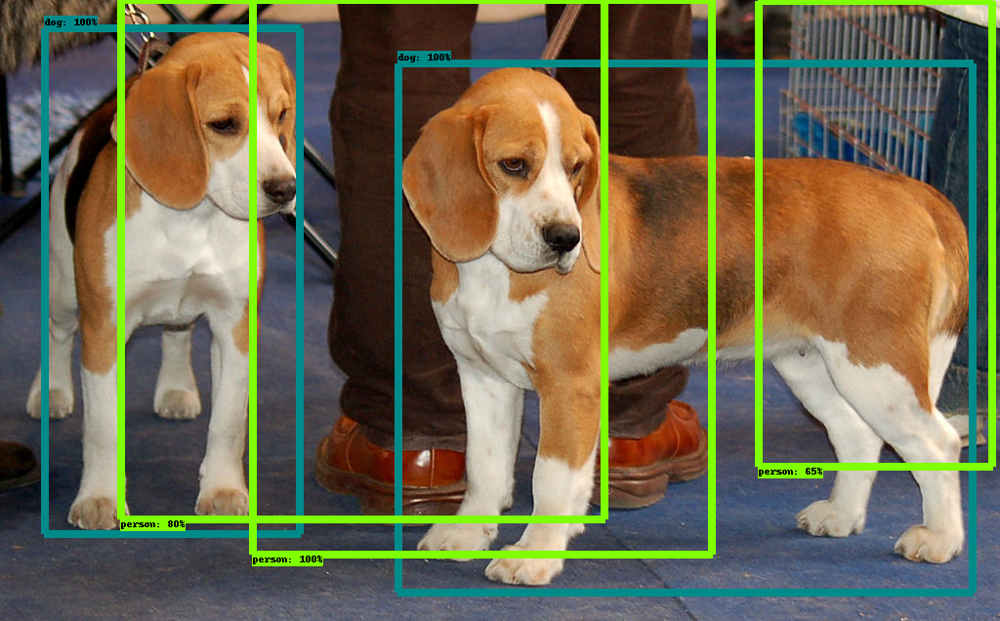

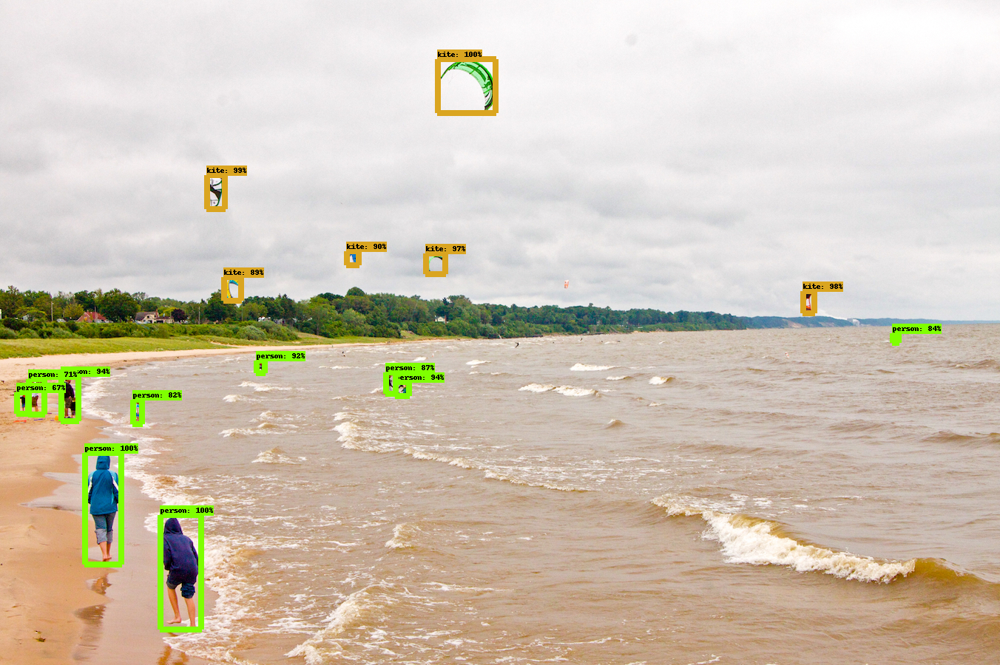

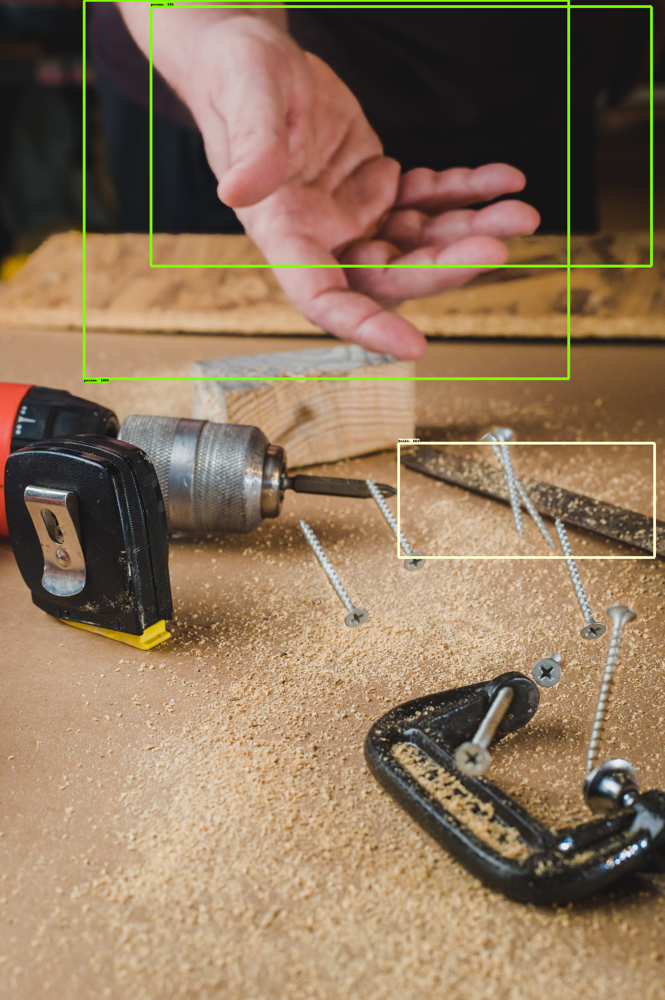

In [27]:
# Nível de confiança = 0.5
for image_path in TEST_IMAGE_PATHS:
  modelo.mostrar_inferencia(image_path)

0.9


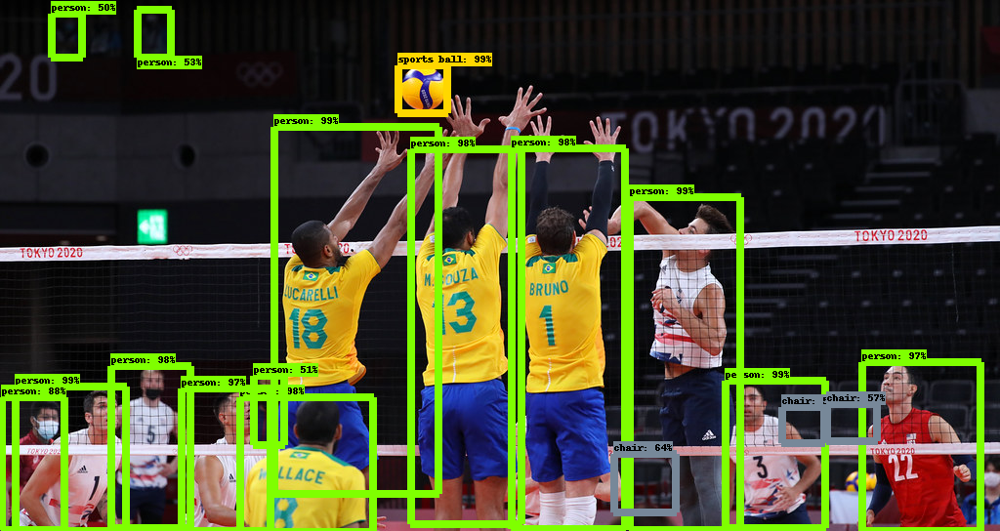

0.9


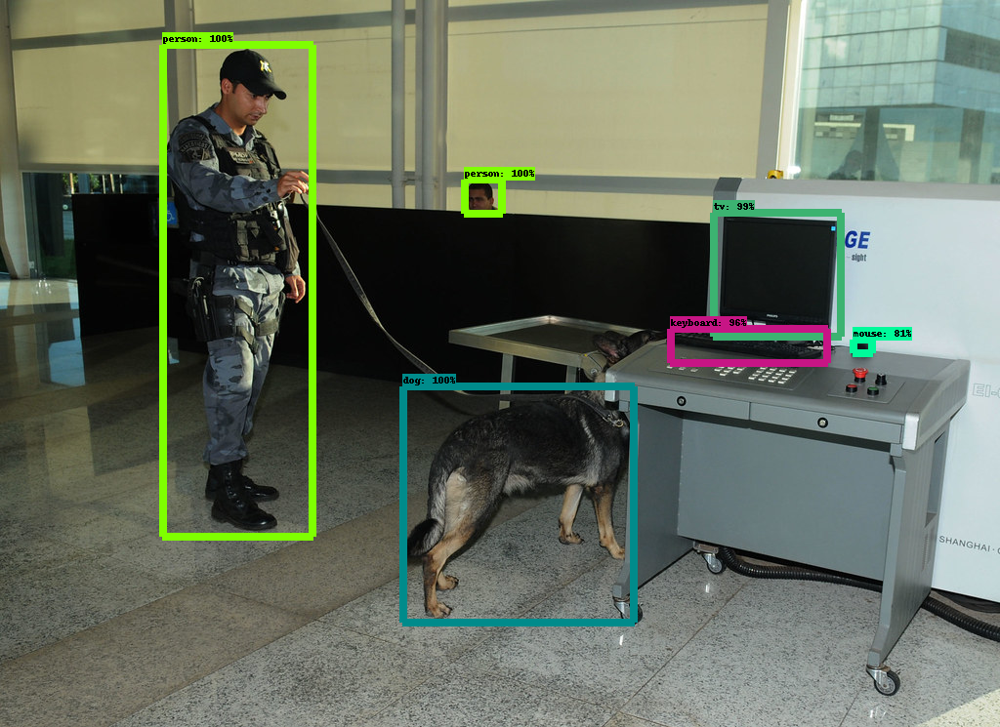

In [12]:
TEST_IMAGE_PATHS = ['/content/img-volei.jpg', '/content/img-policial.jpg']
for image_path in TEST_IMAGE_PATHS:
  modelo.mostrar_inferencia(image_path)